In [29]:
# OpenCV needs to be included first
import cv2
import numpy as np

# for displaying images in jupyter

import matplotlib as mpl
from matplotlib import pyplot as plt
%matplotlib inline
mpl.rcParams['figure.dpi']= 400

(Text(0.5, 1.0, 'blurred Image (25, 25)'), ([], []), ([], []))

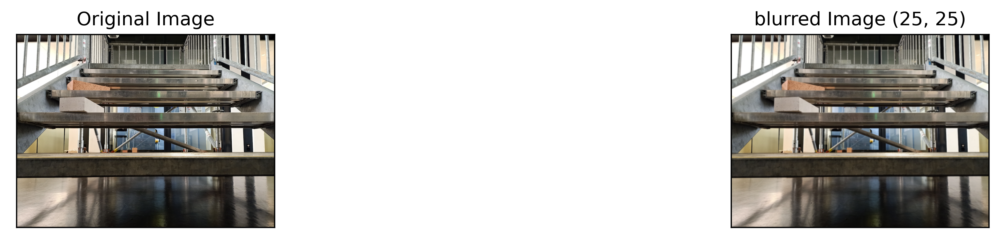

In [30]:
image  = cv2.imread('img-edge/treppe_3.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Bild einlesen und Gaussfilter anwenden
blurred = cv2.GaussianBlur(image, (5,5),0)
plt.figure(figsize=(15,5))
plt.imshow(image)
plt.subplot(221),plt.imshow(image,cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(222),plt.imshow(blurred,cmap = 'gray')
plt.title('blurred Image (25, 25)'), plt.xticks([]), plt.yticks([])

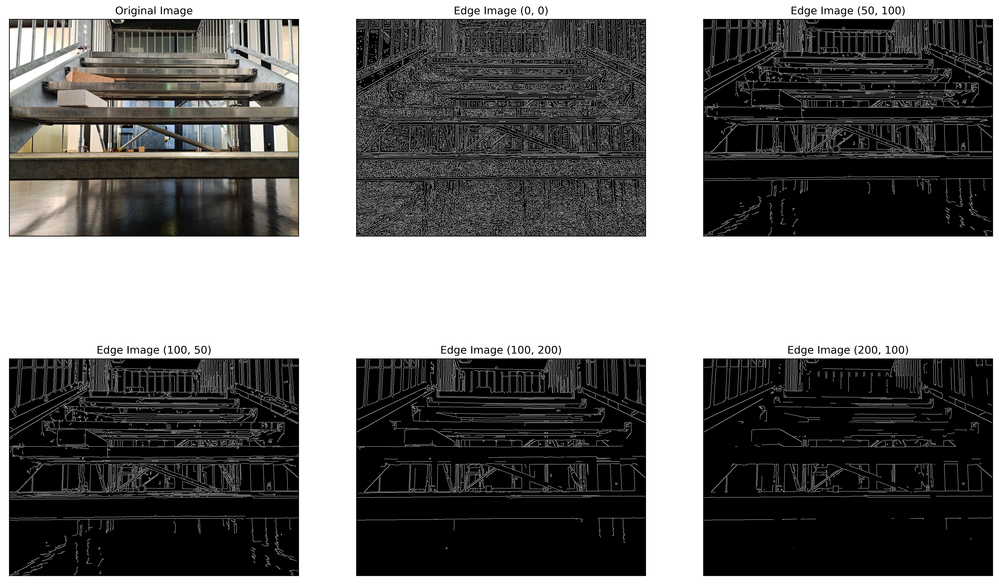

In [31]:
edges_00 = cv2.Canny(blurred,0,0)
edges_50100 = cv2.Canny(blurred,50,100)
edges_10050 = cv2.Canny(blurred,100,50)
edges_100200 = cv2.Canny(blurred,100,200)
edges_200100 = cv2.Canny(blurred,200,255)
edges = cv2.Canny(blurred,30,100)


# Unterschiedliche Canny-Filter zur Eckenextraktion
plt.figure(figsize=(20, 13))
plt.subplot(231),plt.imshow(image,cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(232),plt.imshow(edges_00,cmap = 'gray')
plt.title('Edge Image (0, 0)'), plt.xticks([]), plt.yticks([])
plt.subplot(233),plt.imshow(edges_50100,cmap = 'gray')
plt.title('Edge Image (50, 100)'), plt.xticks([]), plt.yticks([])
plt.subplot(234),plt.imshow(edges_10050,cmap = 'gray')
plt.title('Edge Image (100, 50)'), plt.xticks([]), plt.yticks([])
plt.subplot(235),plt.imshow(edges_100200,cmap = 'gray')
plt.title('Edge Image (100, 200)'), plt.xticks([]), plt.yticks([])
plt.subplot(236),plt.imshow(edges_200100,cmap = 'gray')
plt.title('Edge Image (200, 100)'), plt.xticks([]), plt.yticks([])

plt.show()

515


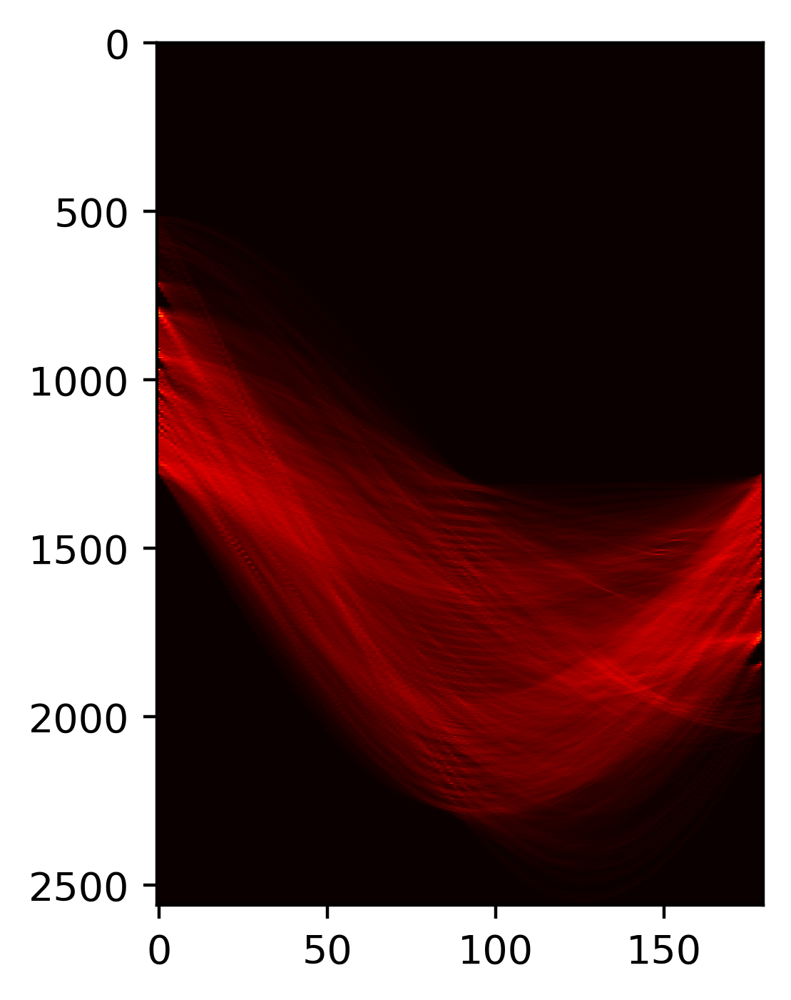

In [32]:
from skimage.transform import hough_line, hough_line_peaks
hspace, theta, distances = hough_line(edges)
print(np.max(hspace))
plt.imshow(hspace, cmap="hot", aspect=0.1)
plt.show()

Text(0.5, 1.0, 'Detected lines')

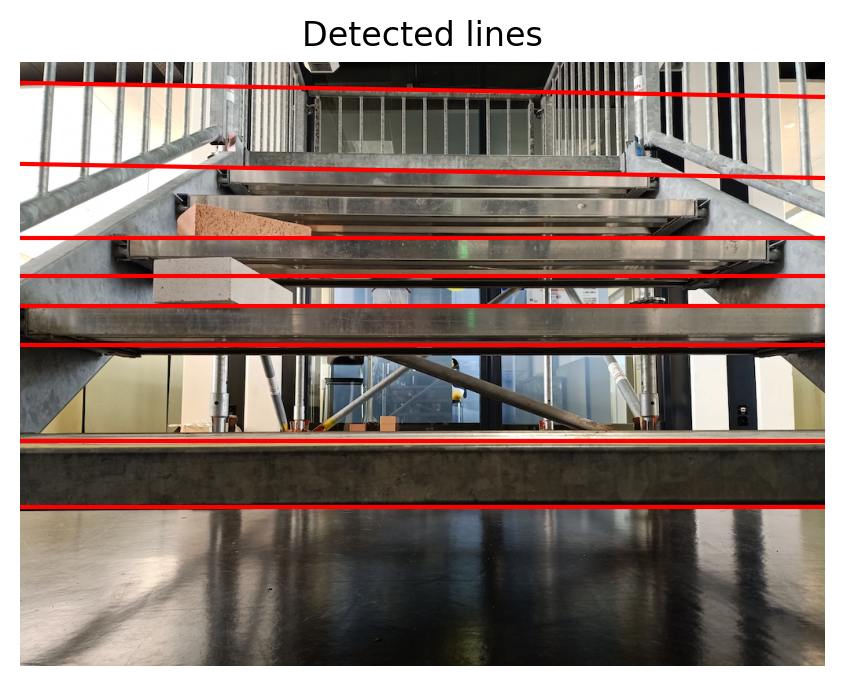

In [33]:
accum, angles, dist_peaks = hough_line_peaks(hspace, theta, distances, threshold=320)
mpl.rcParams['figure.dpi']=200
plt.imshow(image)
ax = plt.gca()
for angle, dist in zip(angles, dist_peaks):
    y0 = (dist - 0 * np.cos(angle)) / np.sin(angle)
    y1 = (dist - image.shape[1] * np.cos(angle)) / np.sin(angle)
    ax.plot((0, image.shape[1]), (y0, y1), '-r')
ax.set_xlim((0, image.shape[1]))
ax.set_ylim((image.shape[0], 0))
ax.set_axis_off()
ax.set_title('Detected lines')

In [34]:
# Mit Trackbars optimale Paramter für Canny-Filter finden
# this function is needed for the createTrackbar step downstream
def nothing(x):
    pass

# read the experimental image
img = blurred

# create trackbar for canny edge detection threshold changes
cv2.namedWindow('canny')

# add ON/OFF switch to "canny"
switch = '0 : OFF \n1 : ON'
cv2.createTrackbar(switch, 'canny', 0, 1, nothing)

# add lower and upper threshold slidebars to "canny"
cv2.createTrackbar('lower', 'canny', 0, 255, nothing)
cv2.createTrackbar('upper', 'canny', 0, 255, nothing)

# Infinite loop until we hit the escape key on keyboard
while(1):

    # get current positions of four trackbars
    lower = cv2.getTrackbarPos('lower', 'canny')
    upper = cv2.getTrackbarPos('upper', 'canny')
    s = cv2.getTrackbarPos(switch, 'canny')

    if s == 0:
        edges = img
    else:
        edges = cv2.Canny(img, lower, upper)

    # display images
    cv2.imshow('original', img)
    cv2.imshow('canny', edges)
    k = cv2.waitKey(1) & 0xFF
    if k == 27:   # hit escape to quit
        break

cv2.destroyAllWindows()